# Task 1

In [81]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import IPython.display as ipd
import soundfile as sf
from pydub import AudioSegment, effects  
from scipy.signal import butter, stft, istft, filtfilt

In [82]:
# load audio file
x, sr = librosa.load('Task_1/t1_audio.wav')

In [83]:
# play audio file
ipd.Audio(x, rate=sr)

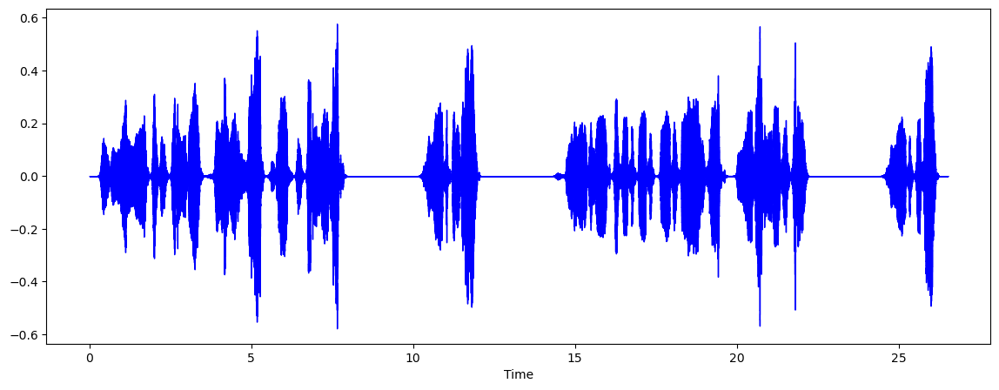

In [84]:
# display waveform
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr=sr, max_points=11025, axis='time', offset=0.0, marker='', where='post', label=None, transpose=False, ax=None, color="blue")

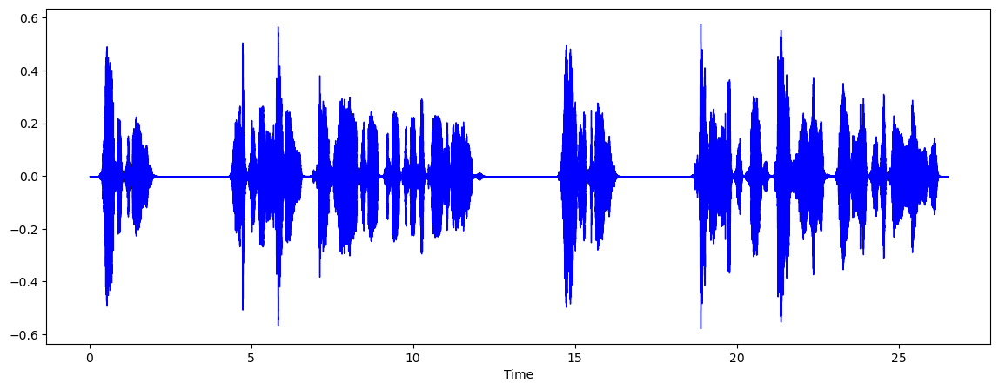

In [85]:
# reverse waveform
x_reversed = np.flip(x)
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x_reversed, sr=sr, max_points=11025, axis='time', offset=0.0, marker='', where='post', label=None, transpose=False, ax=None, color="blue")

In [86]:
# play reversed audio
ipd.Audio(x_reversed, rate=sr)

In [87]:
# speed up audio
x_fast = librosa.effects.time_stretch(x_reversed, rate=2)
ipd.Audio(x_fast, rate=sr)

67.9222° N, 26.5046° E
Lapland

# Task 2

In [88]:
# load audio files
a, asr = librosa.load('Task_2/t2_audio_a.wav')
b, bsr = librosa.load('Task_2/t2_audio_b.wav')
c, csr = librosa.load('Task_2/t2_audio_c.wav')
d, dsr = librosa.load('Task_2/t2_audio_d.wav')

In [89]:
# play audio files
ipd.Audio(a, rate=asr)

In [90]:
ipd.Audio(b, rate=bsr)

In [91]:
ipd.Audio(c, rate=csr)

In [92]:
ipd.Audio(d, rate=dsr)

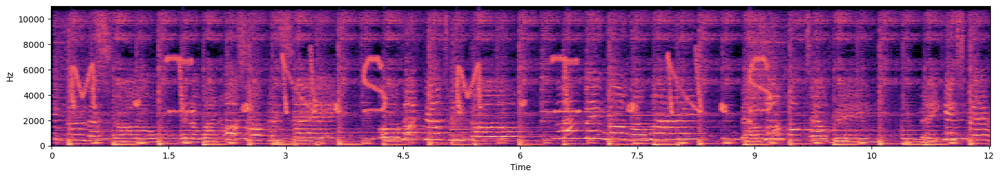

In [93]:
# display spectrograms
fig, ax = plt.subplots(sharex=True, figsize=(20, 3))
D = librosa.amplitude_to_db(np.abs(librosa.stft(a)), ref=np.max)
img = librosa.display.specshow(D, y_axis='linear', x_axis='time',sr=sr)

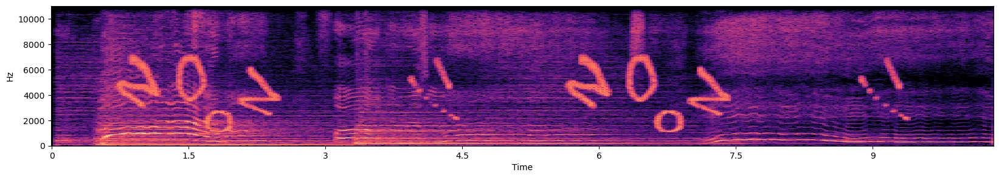

In [94]:
fig, ax = plt.subplots(sharex=True, figsize=(20, 3))
D = librosa.amplitude_to_db(np.abs(librosa.stft(b)), ref=np.max)
img = librosa.display.specshow(D, y_axis='linear', x_axis='time',sr=sr)

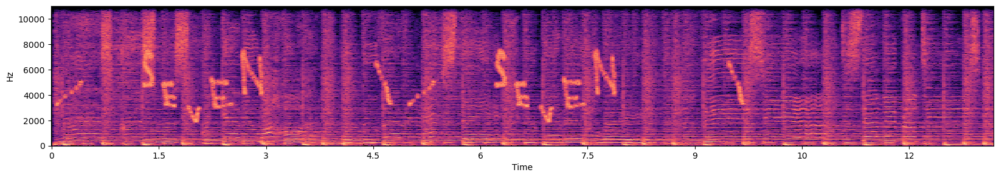

In [95]:
fig, ax = plt.subplots(sharex=True, figsize=(20, 3))
D = librosa.amplitude_to_db(np.abs(librosa.stft(c)), ref=np.max)
img = librosa.display.specshow(D, y_axis='linear', x_axis='time',sr=sr)

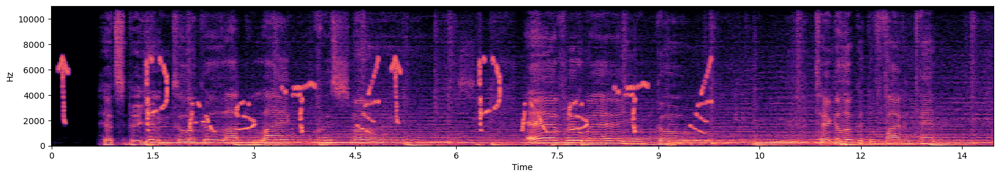

In [96]:
fig, ax = plt.subplots(sharex=True, figsize=(20, 3))
D = librosa.amplitude_to_db(np.abs(librosa.stft(d)), ref=np.max)
img = librosa.display.specshow(D, y_axis='linear', x_axis='time',sr=sr)

12:07

# Task 3

In [97]:
# load audio file
x, sr = librosa.load('Task_3/C.Noisy_Voice.wav')
ipd.Audio(x, rate=sr)

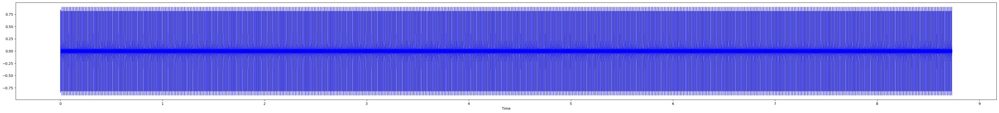

In [98]:
# display waveform
plt.figure(figsize=(50, 5))
librosa.display.waveshow(x, sr=sr, max_points=11025, axis='time', offset=0.0, marker='', where='post', label=None, transpose=False, ax=None, color="blue")

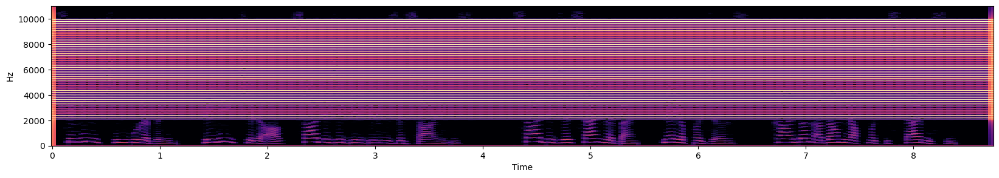

In [99]:
# display spectrogram
fig, ax = plt.subplots(sharex=True, figsize=(20, 3))
D = librosa.amplitude_to_db(np.abs(librosa.stft(x)), ref=np.max)
img = librosa.display.specshow(D, y_axis='linear', x_axis='time',sr=sr)

In [100]:
# Design a bandpass filter for the desired frequency range (100 Hz to 2000 Hz)
# highcut of 2000 Hz is too high, so we use 1250 Hz instead
# 1250 Hz is the highest frequency that does not distort the original signal
lowcut = 100
highcut = 1250
# nyquist frequency is half the sampling rate
nyquist = 0.5 * sr
low = lowcut / nyquist
high = highcut / nyquist
# butterworth filter order
b, a = butter(N=6, Wn=[low, high], btype='bandpass')

# Apply the bandpass filter to the original signal
y_filtered = filtfilt(b, a, x)

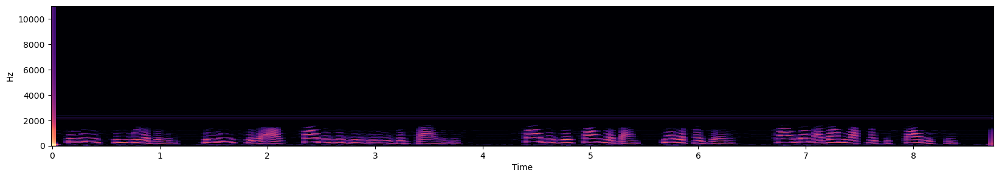

In [101]:
# display spectrogram of filtered signal
fig, ax = plt.subplots(sharex=True, figsize=(20, 3))
D = librosa.amplitude_to_db(np.abs(librosa.stft(y_filtered)), ref=np.max)
img = librosa.display.specshow(D, y_axis='linear', x_axis='time',sr=sr)

In [102]:
# play filtered signal
ipd.Audio(y_filtered, rate=sr)

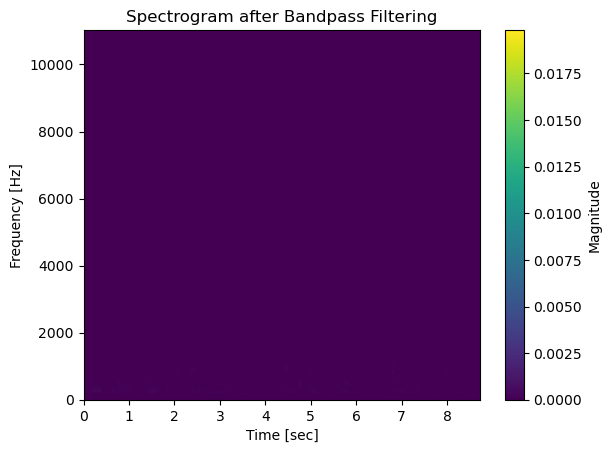

In [103]:
# apply STFT to filtered signal
f, t, Zxx = stft(y_filtered, fs=sr, window='hann')
# Plot the spectrogram
plt.pcolormesh(t, f, np.abs(Zxx), shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.title('Spectrogram after Bandpass Filtering')
plt.colorbar(label='Magnitude')
plt.show()

/var/folders/qw/v63kw36s61v0bl5_lbslpgtw0000gn/T/ipykernel_60861/1598144665.py:2: ComplexWarning: Casting complex values to real discards the imaginary part
  librosa.display.waveshow(Zxx.astype(np.float32), sr=sr, max_points=11025, axis='time', offset=0.0, marker='', where='post', label=None, transpose=False, ax=None, color="blue")


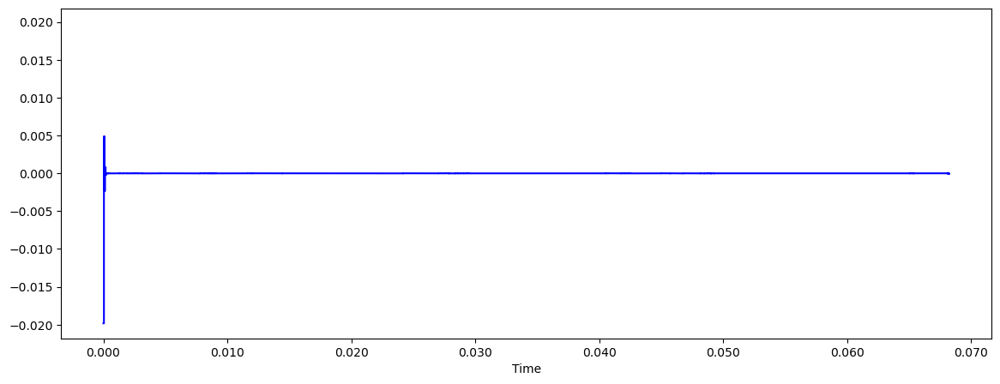

In [104]:
# display waveform of signal after STFT
plt.figure(figsize=(14, 5))
librosa.display.waveshow(Zxx.astype(np.float32), sr=sr, max_points=11025, axis='time', offset=0.0, marker='', where='post', label=None, transpose=False, ax=None, color="blue")

In [105]:
# Perform inverse STFT to reconstruct the time-domain signal
_, y_reconstructed = istft(Zxx, fs=sr)

# Convert to floating-point array
y_reconstructed_float = y_reconstructed.astype(np.float32)  # or np.float64

<Figure size 1400x500 with 0 Axes>

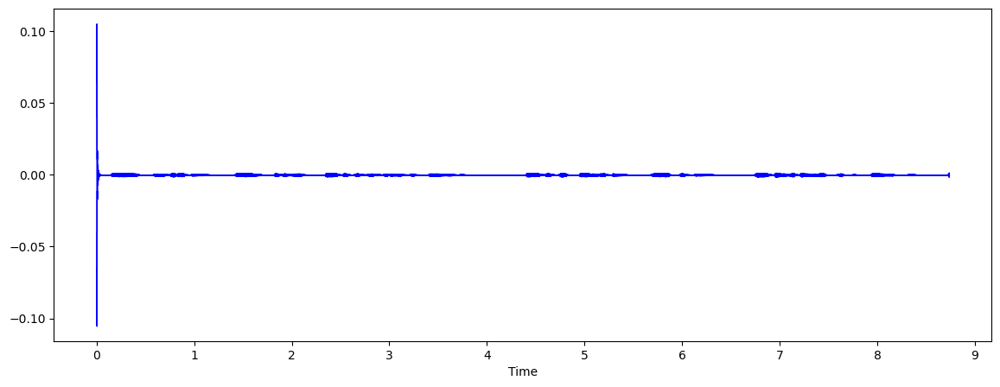

In [106]:
# display waveform of reconstructed signal
plt.figure(figsize=(14, 5))
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y_reconstructed_float, sr=sr, max_points=11025, axis='time', offset=0.0, marker='', where='post', label=None, transpose=False, ax=None, color="blue")

In [107]:
# remove 50 milliseconds of noise from the beginning of the signal
milliseconds_to_remove = 0.05
samples_to_remove = int(milliseconds_to_remove * sr)
y_trimmed = y_reconstructed_float[samples_to_remove:]

In [108]:
# play trimmed signal
ipd.Audio(y_trimmed, rate=sr)

In [109]:
# save trimmed signal to file
sf.write('Task_3/quiet_output_audio.wav', y_trimmed, sr)

In [110]:
# normalize signal
rawsound = AudioSegment.from_file("Task_3/quiet_output_audio.wav", "wav")  
normalizedsound = effects.normalize(rawsound)
normalizedsound.export("Task_3/output.wav", format="wav")

<_io.BufferedRandom name='Task_3/output.wav'>

In [111]:
# load normalized signal
x, sr = librosa.load('Task_3/output.wav')
ipd.Audio(x, rate=sr)

<Figure size 1400x500 with 0 Axes>

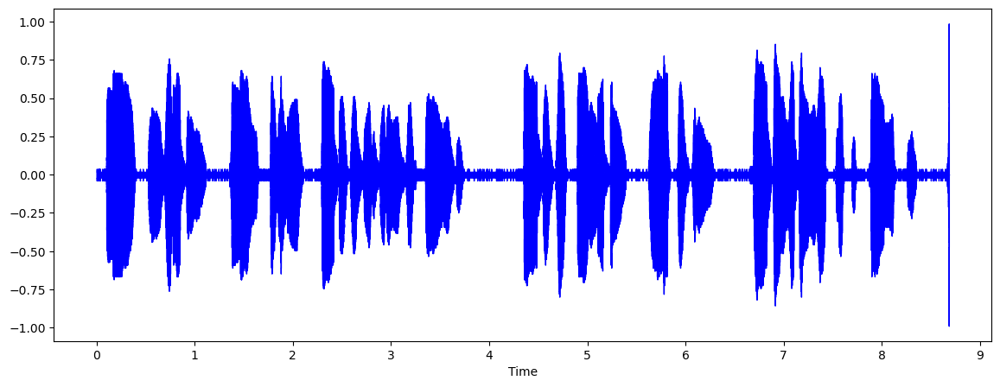

In [112]:
# display waveform of normalized signal
plt.figure(figsize=(14, 5))
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr=sr, max_points=11025, axis='time', offset=0.0, marker='', where='post', label=None, transpose=False, ax=None, color="blue")

Detected language: Turkish

[00:00.000 --> 00:08.640]  I'm here for you, take me in, we only have each other, just you and me, what are we going to do, do you want to make a snowman?